In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,roc_auc_score,confusion_matrix,roc_curve,auc
from sklearn import preprocessing
from warnings import filterwarnings
import os
import cv2

# IGNORING UNNECESSARRY WARNINGS

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# Import and Shuffle the dataset

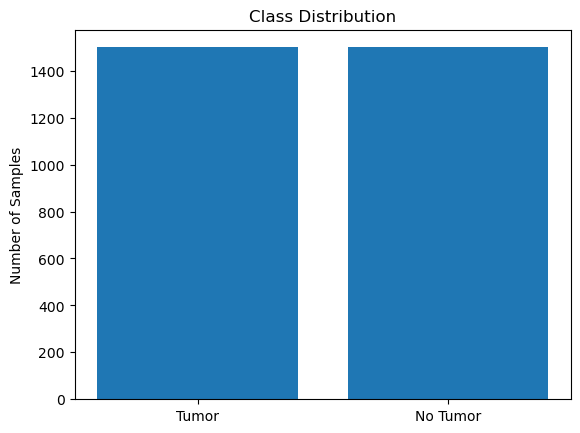

In [2]:
path = os.listdir('C:\\Users\\rcrat\\Downloads\\dataset')
classes = {'no':0, 'yes':1}

import random

# data set
data_x = []
data_y = []

# We will use this dataset for visualizing in test prediction
test_x = []
test_y = []

data = []

for cls in classes:
    pth = 'C:\\Users\\rcrat\\Downloads\\dataset\\' + cls
    for j in os.listdir(pth):
        img = cv2.imread(pth + '/' + j, 0)
        img = cv2.resize(img, (200, 200))
        data.append((img, classes[cls]))
    
# Shuffle the data for the current class
random.shuffle(data)

# Define the class names
class_names = ['Tumor', 'No Tumor']

# Count the number of samples in each class
class_counts = {}
for _, cls in data:
    if cls in class_counts:
        class_counts[cls] += 1
    else:
        class_counts[cls] = 1

# Plot the bar chart
plt.bar(class_names, class_counts.values())
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()

In [3]:
# Split the data into train and test sets
images, labels = zip(*data)
data_images, test_images, data_labels, test_labels = train_test_split(images, labels, test_size=0.01, random_state=42)

# Append the shuffled data,test to the main lists
data_x.extend(data_images)
data_y.extend(data_labels)

test_x.extend(test_images)
test_y.extend(test_labels)
print(test_y)
    

print('Data set size : ',len(data_x))
print('Test set size : ',len(test_x))

[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0]
Data set size :  2970
Test set size :  30


# Prepare data

In [4]:
data_x = np.array(data_x)
data_y = np.array(data_y)

data_x_updated = data_x.reshape(len(data_x), -1)
data_x_updated.shape

xtrain, xtest, ytrain, ytest = train_test_split(data_x_updated, data_y, random_state=10,
                                               test_size=.20)
xtrain.shape, xtest.shape

((2376, 40000), (594, 40000))

## Feature Scaling

In [5]:
# AS we can see, x_train & x_test are not scale
print(xtrain)
print(xtrain.max(), xtrain.min())
print(xtest.max(), xtest.min())

# Scaling the dataset
scaler = preprocessing.MinMaxScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.fit_transform(xtest)

print(xtrain.max(), xtrain.min())
print(xtest.max(), xtest.min())
print(xtrain)

[[ 0  0  0 ...  0  0  0]
 [21 21 21 ... 45 55 17]
 [ 0  0  0 ...  4  3  0]
 ...
 [60 26 32 ... 34 34 58]
 [ 0  0  0 ...  1  1  1]
 [ 4  2  4 ...  1  1  3]]
255 0
255 0
1.0 0.0
1.0000000000000002 0.0
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.08235294 0.08235294 0.08235294 ... 0.17647059 0.21568627 0.06666667]
 [0.         0.         0.         ... 0.01568627 0.01176471 0.        ]
 ...
 [0.23529412 0.10196078 0.1254902  ... 0.13333333 0.13333333 0.22745098]
 [0.         0.         0.         ... 0.00392157 0.00392157 0.00392157]
 [0.01568627 0.00784314 0.01568627 ... 0.00392157 0.00392157 0.01176471]]


# Drawing metrics function

In [6]:
def plot_metrics(ytest,pred):
    
    # Compute confusion matrix
    cm = confusion_matrix(ytest, pred)

    # Compute classification report
    report = classification_report(ytest, pred)
    #  report
    print('\n',report,'\n','_'*230,'\n\n')


    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(ytest, pred)
    roc_auc = auc(fpr, tpr)

    # Plot confusion matrix, classification report, and ROC curve
    plt.figure(figsize=(15, 5))

    # Plot confusion matrix
    plt.subplot(1, 2, 2)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix", {'fontsize': 20},y=1.3)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")

    # Plot ROC curve
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='b', label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='r', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)', {'fontsize': 20},y=1.3)
    plt.legend(loc="lower right")

    plt.tight_layout()
    plt.show()

# **Logisitic Regression**

## Training

In [7]:
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

# Training the dataset
lg = LogisticRegression(C=0.1)
lg.fit(xtrain, ytrain)


# Prediction
pred = lg.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.97      0.99      0.98       289
           1       0.99      0.97      0.98       305

    accuracy                           0.98       594
   macro avg       0.98      0.98      0.98       594
weighted avg       0.98      0.98      0.98       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




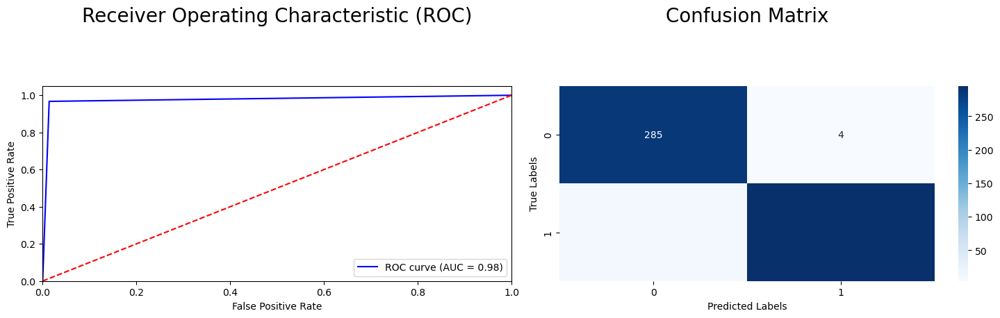

In [8]:
plot_metrics(ytest,pred)

## Visualize the proccess

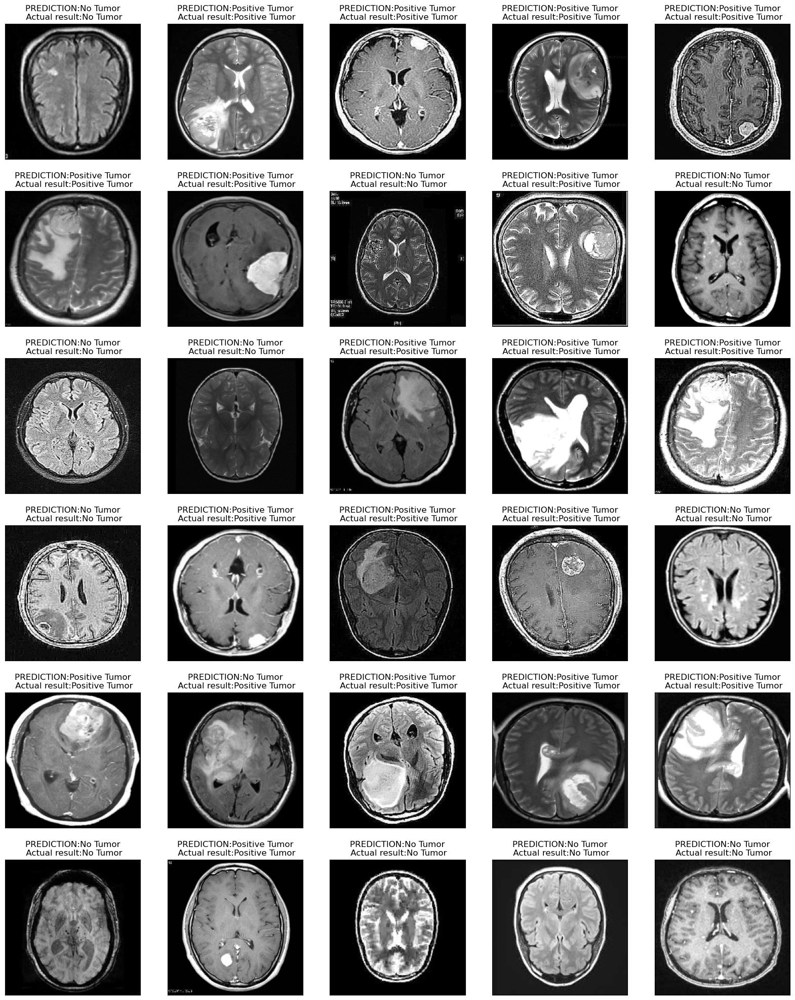

In [9]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = lg.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")



# **SVC Model**

## Training and getting report

In [10]:
from sklearn.svm import SVC

# Training the dataset
sv = SVC()
sv.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", sv.score(xtrain, ytrain))
print("Testing Score:", sv.score(xtest, ytest))

# Prediction
pred = sv.predict(xtest)

Training Score: 0.9827441077441077
Testing Score: 0.9663299663299664


## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.98      0.95      0.96       289
           1       0.96      0.98      0.97       305

    accuracy                           0.97       594
   macro avg       0.97      0.97      0.97       594
weighted avg       0.97      0.97      0.97       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




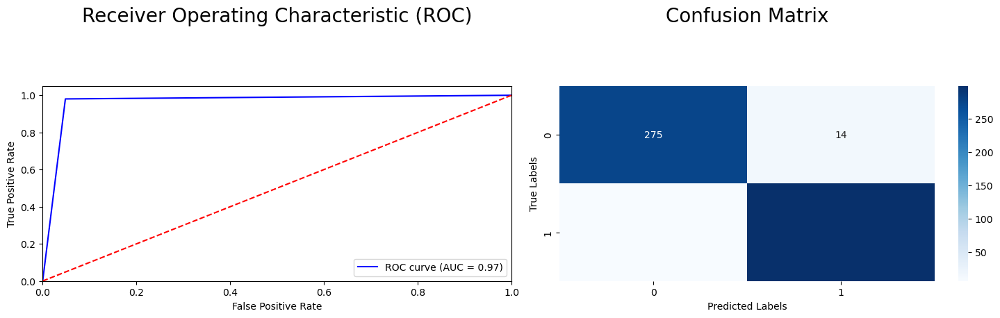

In [11]:
plot_metrics(ytest,pred)

## Visualize the proccess

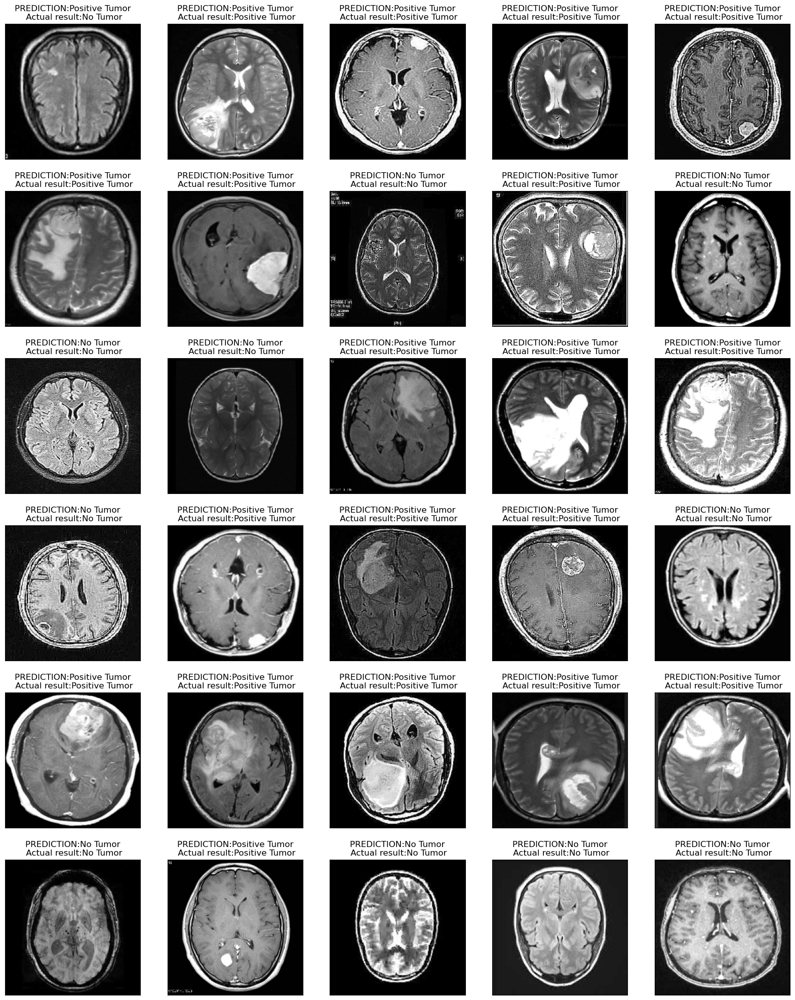

In [12]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = sv.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")


# **kNN**

## Training

In [13]:
from sklearn.neighbors import KNeighborsClassifier

# train the dataset
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(xtrain, ytrain)

# Prediction
pred = knn_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.89      0.99      0.93       289
           1       0.99      0.88      0.93       305

    accuracy                           0.93       594
   macro avg       0.94      0.93      0.93       594
weighted avg       0.94      0.93      0.93       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




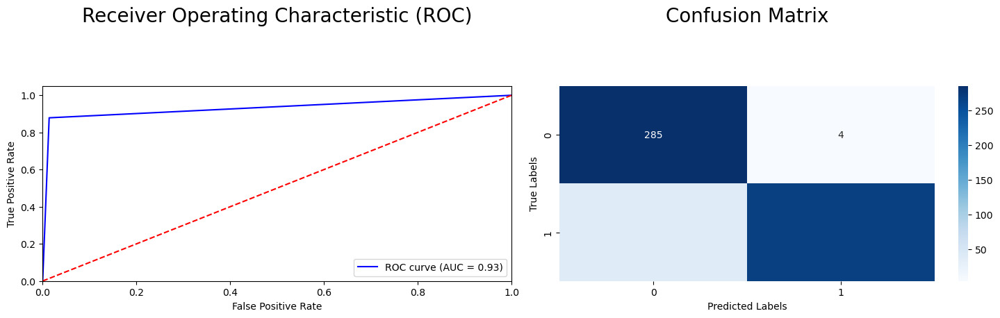

In [14]:
plot_metrics(ytest, pred)

## Visualize the proccess

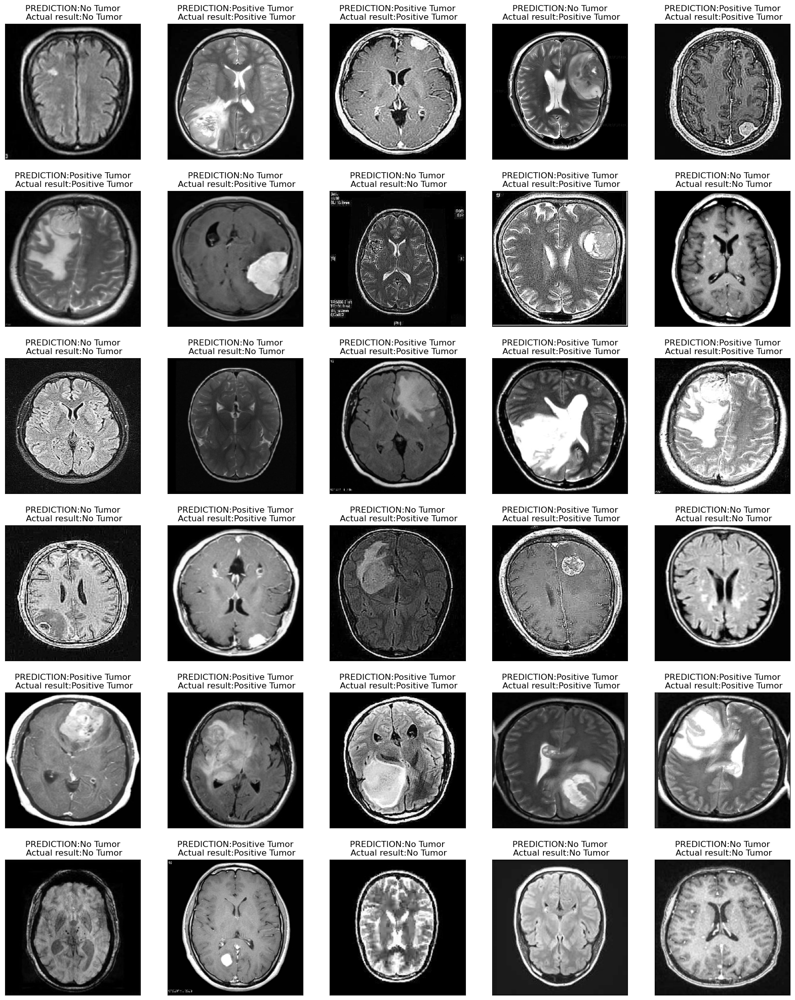

In [15]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = knn_model.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")

# **Naive Bayes**

## Training and getting report

In [16]:
from sklearn.naive_bayes import GaussianNB

# train the dataset
nb_model = GaussianNB()
nb_model = nb_model.fit(xtrain, ytrain)


# Prediction
pred = nb_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.67      0.81      0.73       289
           1       0.78      0.62      0.69       305

    accuracy                           0.71       594
   macro avg       0.72      0.71      0.71       594
weighted avg       0.72      0.71      0.71       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




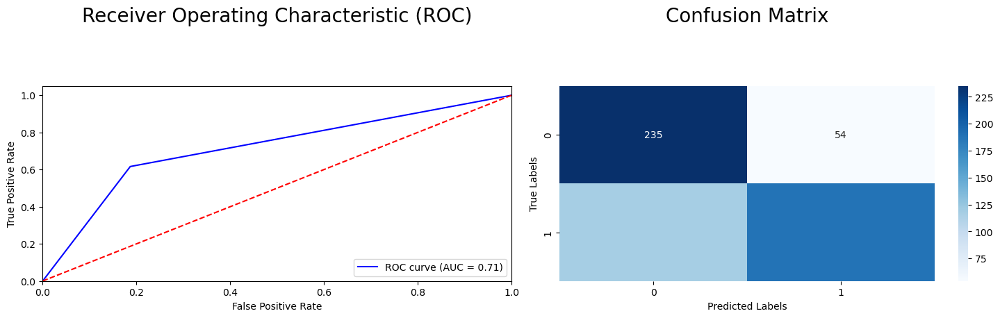

In [17]:
plot_metrics(ytest,pred)

## Visualize the proccess

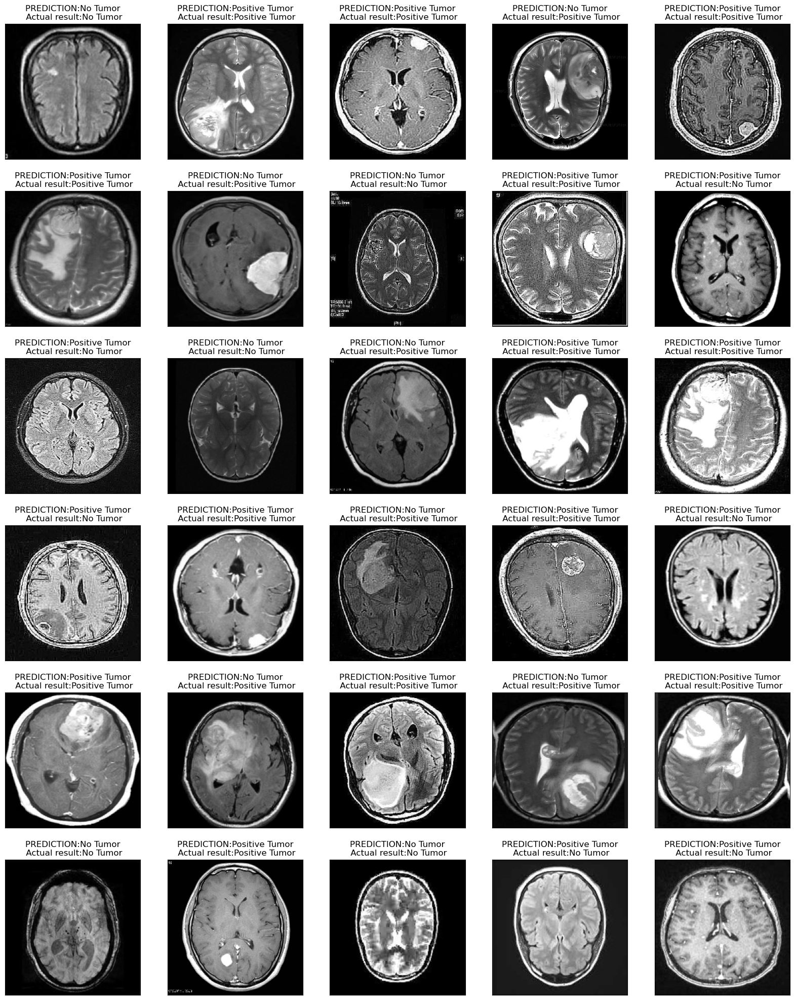

In [18]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = nb_model.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")

# **Neural Networks**

## Plot function

In [19]:
def plot_history(history):
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))  # Create a figure with 1 row and 3 columns

    # Plot the first graph on the first axis (axs[0])
    axs[0].plot(history.history['loss'], label='loss')
    axs[0].plot(history.history['val_loss'], label='val_loss')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Binary crossentropy')
    axs[0].grid(True)

    # Plot the second graph on the second axis (axs[1])
    axs[1].plot(history.history['accuracy'], label='accuracy')
    axs[1].plot(history.history['val_accuracy'], label='val_accuracy')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy')
    axs[1].grid(True)

    # Plot the third graph on the third axis (axs[2])
    summary = pd.DataFrame(history.history)
    summary.plot(ax=axs[2])

    plt.tight_layout()  # Adjust the spacing between subplots

    plt.show()  # Display the figure

## Train function

In [20]:
import tensorflow as tf

def train_model(X_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs):
  nn_model = tf.keras.Sequential([
      tf.keras.layers.Dense(num_nodes, activation='relu', input_shape=(None,40000)),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(num_nodes, activation='relu'),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(1, activation='sigmoid')
  ])

  nn_model.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='binary_crossentropy',
                  metrics=['accuracy'])
  history = nn_model.fit(
    X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0
  )

  return nn_model, history

## Finding best combination for least value loss by training

TensorFlow version: 2.17.0

Data shapes:
xtrain shape: (2376, 40000)
ytrain shape: (2376,)
xtest shape: (594, 40000)
ytest shape: (594,)

Training with: 32 nodes, dropout 0, lr 0.01, batch size 32



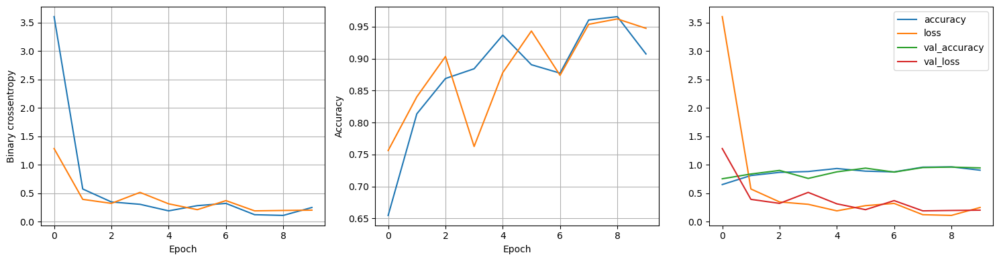

LOSS:  0.1679
ACCURACY:  0.94
________________________________________________________________________________ 


Training with: 32 nodes, dropout 0, lr 0.01, batch size 128


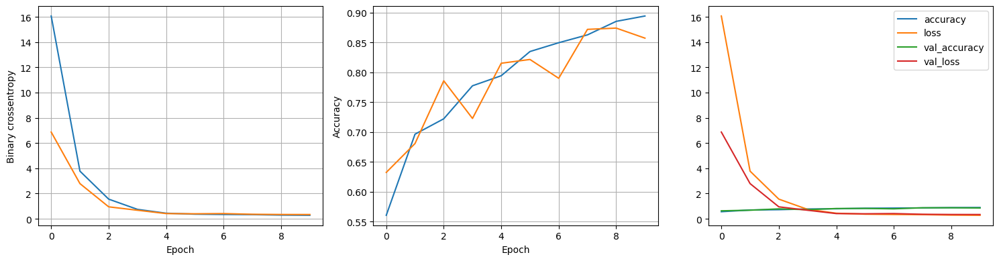

LOSS:  0.3425
ACCURACY:  0.85
________________________________________________________________________________ 


Training with: 32 nodes, dropout 0, lr 0.001, batch size 32


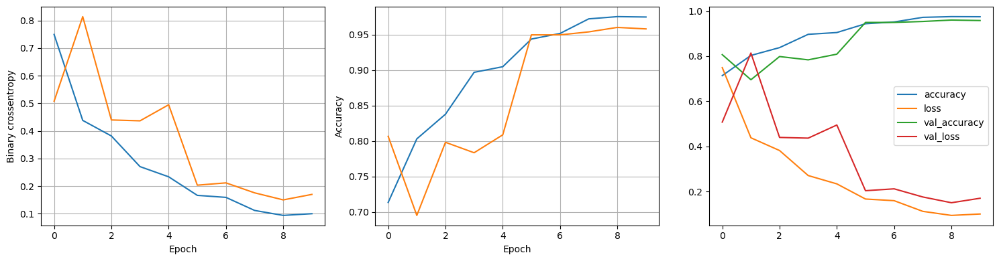

LOSS:  0.1490
ACCURACY:  0.95
________________________________________________________________________________ 


Training with: 32 nodes, dropout 0, lr 0.001, batch size 128


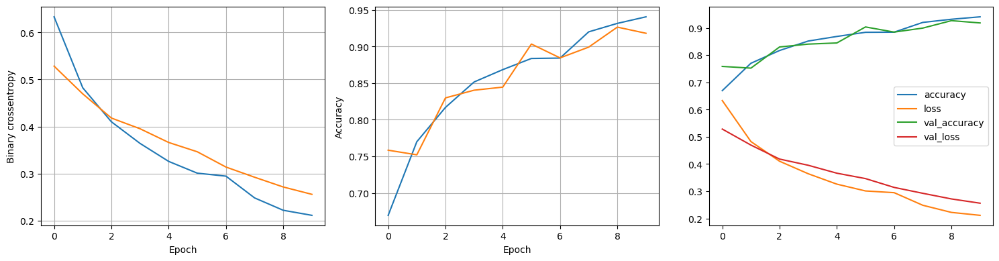

LOSS:  0.2692
ACCURACY:  0.91
________________________________________________________________________________ 


Training with: 64 nodes, dropout 0, lr 0.01, batch size 32


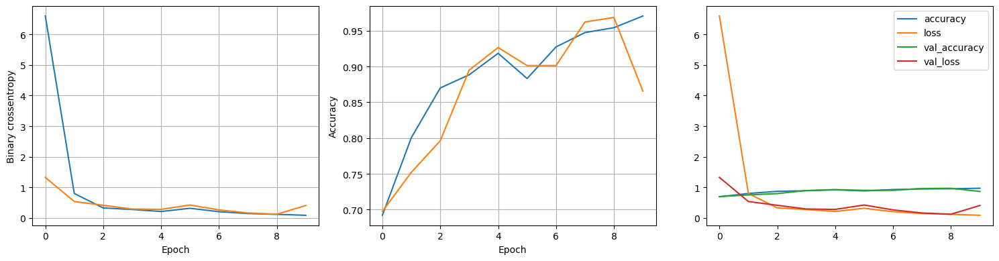

LOSS:  0.4361
ACCURACY:  0.87
________________________________________________________________________________ 


Training with: 64 nodes, dropout 0, lr 0.01, batch size 128


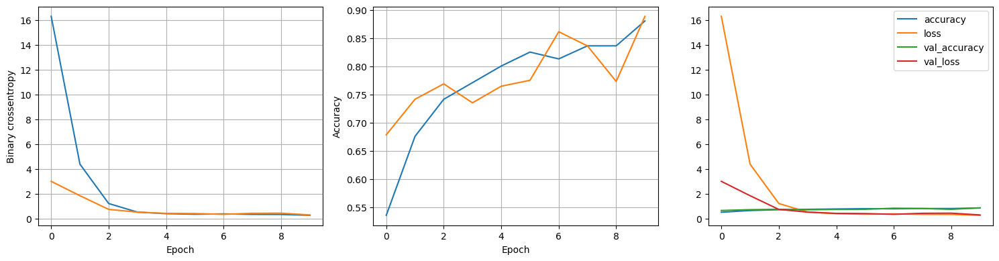

LOSS:  0.3006
ACCURACY:  0.87
________________________________________________________________________________ 


Training with: 64 nodes, dropout 0, lr 0.001, batch size 32


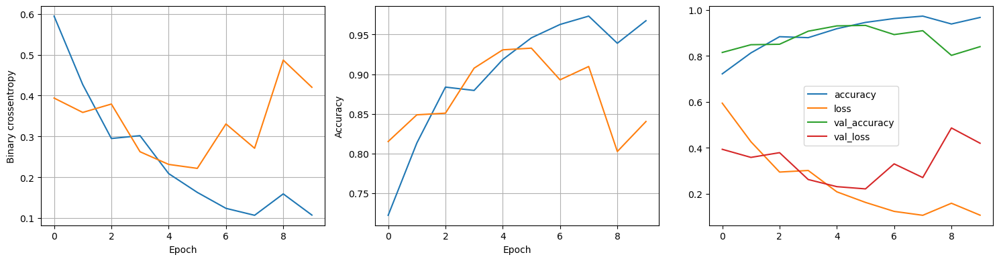

LOSS:  0.3464
ACCURACY:  0.85
________________________________________________________________________________ 


Training with: 64 nodes, dropout 0, lr 0.001, batch size 128


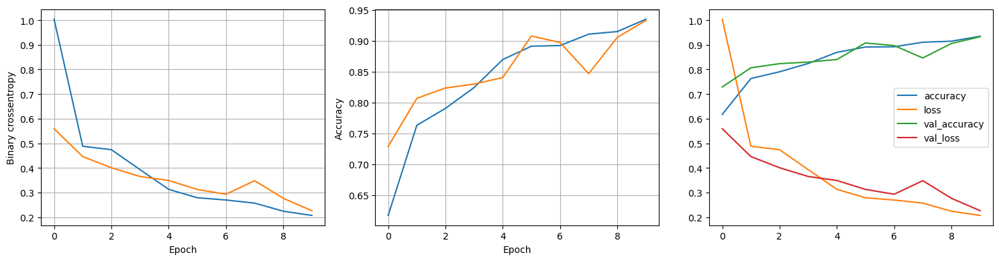

LOSS:  0.2399
ACCURACY:  0.92
________________________________________________________________________________ 


Best model validation loss: 0.14901216328144073


In [21]:
# First print data shapes and TensorFlow version
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("\nData shapes:")
print(f"xtrain shape: {xtrain.shape}")
print(f"ytrain shape: {ytrain.shape}")
print(f"xtest shape: {xtest.shape}")
print(f"ytest shape: {ytest.shape}")

def train_model(X_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs):
    # Clear any previous models from memory
    tf.keras.backend.clear_session()
    
    # Create model with correct input shape
    nn_model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(40000,)),  # Explicit input layer
        tf.keras.layers.Dense(num_nodes, activation='relu'),
        tf.keras.layers.Dropout(dropout_prob),
        tf.keras.layers.Dense(num_nodes//2, activation='relu'),
        tf.keras.layers.Dropout(dropout_prob),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    # Compile model
    nn_model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    # Train model
    history = nn_model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_split=0.2,
        verbose=0
    )
    
    return nn_model, history

# Ensure data is properly preprocessed
# Reshape if needed
if len(xtrain.shape) > 2:
    xtrain = xtrain.reshape(xtrain.shape[0], -1)
    xtest = xtest.reshape(xtest.shape[0], -1)

# Normalize if not already done
if xtrain.max() > 1:
    xtrain = xtrain / 255.0
    xtest = xtest / 255.0

# Convert labels to correct format
ytrain = ytrain.astype('float32')
ytest = ytest.astype('float32')

# Grid search with error handling
least_val_loss = float('inf')
least_loss_model = None
epochs = 10
dropout_prob = 0

try:
    for num_nodes in [32, 64]:
        for lr in [0.01, 0.001]:
            for batch_size in [32, 128]:
                print(f"\nTraining with: {num_nodes} nodes, dropout {dropout_prob}, lr {lr}, batch size {batch_size}")
                
                try:
                    model, history = train_model(xtrain, ytrain, num_nodes, dropout_prob, lr, batch_size, epochs)
                    plot_history(history)
                    
                    results = model.evaluate(xtest, ytest, verbose=0)
                    print("LOSS:  " + "%.4f" % results[0])
                    print("ACCURACY:  " + "%.2f" % results[1])
                    val_loss = results[0]
                    print("_"*80,'\n')
                    
                    if val_loss < least_val_loss:
                        least_val_loss = val_loss
                        least_loss_model = model
                        
                except Exception as e:
                    print(f"Error during training: {str(e)}")
                    continue

except Exception as e:
    print(f"Fatal error: {str(e)}")

print("\nBest model validation loss:", least_val_loss)

In [22]:
Model_Results = least_loss_model.evaluate(xtest,ytest)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9601 - loss: 0.1543
LOSS:  0.1490
ACCURACY:  0.95


## Confusion matrix , Classification Report , ROC Curves

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

               precision    recall  f1-score   support

         0.0       0.96      0.94      0.95       289
         1.0       0.95      0.96      0.96       305

    accuracy                           0.95       594
   macro avg       0.95      0.95      0.95       594
weighted avg       0.95      0.95      0.95       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




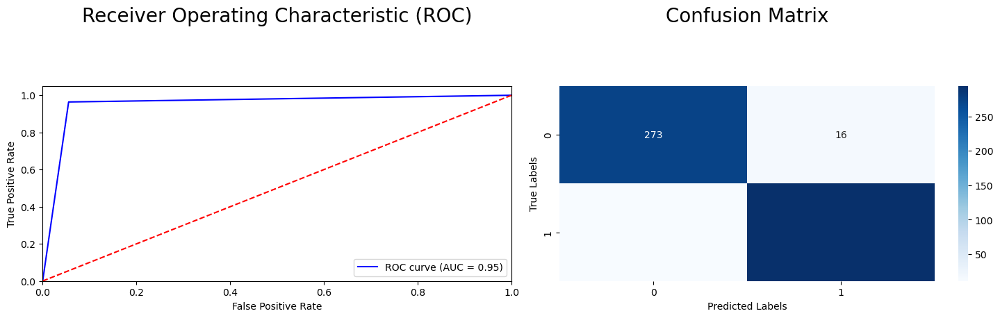

In [23]:
y_pred = least_loss_model.predict(xtest)
y_pred = (y_pred > 0.5).astype(int).reshape(-1,)
plot_metrics(ytest, y_pred)

## Visualize the proccess

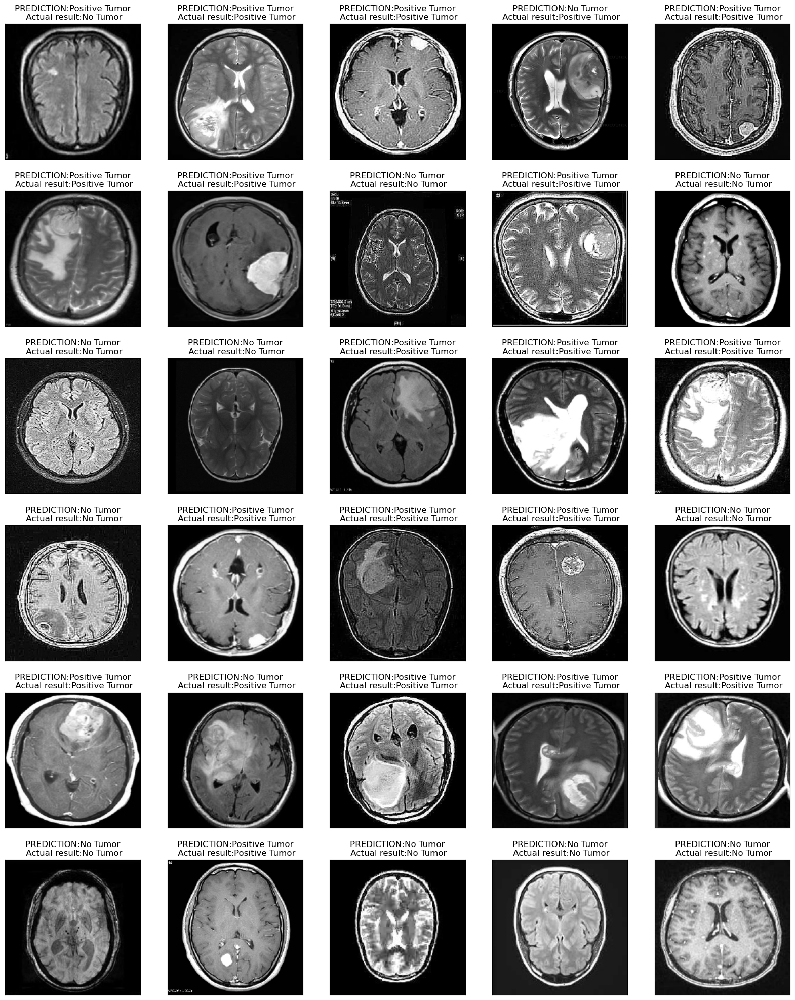

In [24]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img = test_x[i].reshape(1,-1)/255
       p = (least_loss_model.predict(img,verbose = 0)> 0.5).astype(int)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0][0]]}\n Actual result:{dec[test_y[i]]}")

# **Random Forest**

## Training

In [25]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(xtrain, ytrain)

y_pred = rf.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

         0.0       0.98      0.96      0.97       289
         1.0       0.96      0.98      0.97       305

    accuracy                           0.97       594
   macro avg       0.97      0.97      0.97       594
weighted avg       0.97      0.97      0.97       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




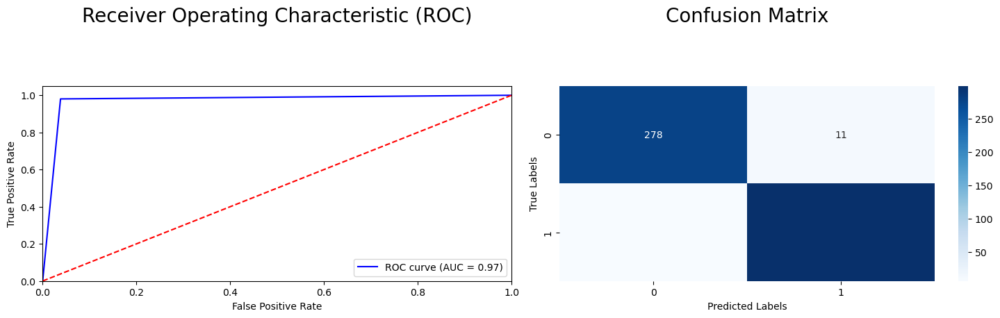

In [26]:
plot_metrics(ytest,y_pred)

## Visualize the proccess

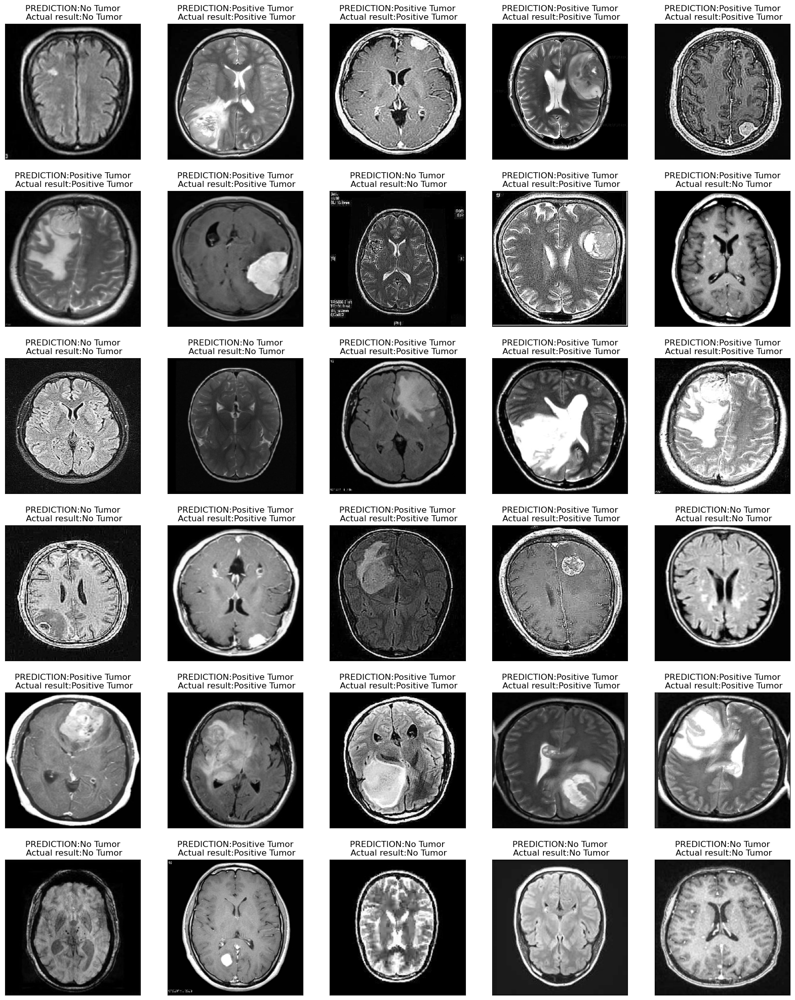

In [27]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = rf.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")


# **K-means clustering**

## Training

In [28]:
from sklearn.cluster import KMeans


# Scaling the dataset (but here we use all the dataset not only train)
scaler = preprocessing.MinMaxScaler()
data_x = scaler.fit_transform(data_x_updated)

k = 2  # Number of clusters (normal and tumor)
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(data_x)

y_pred = kmeans.labels_

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.64      0.76      0.69      1489
           1       0.70      0.57      0.63      1481

    accuracy                           0.66      2970
   macro avg       0.67      0.66      0.66      2970
weighted avg       0.67      0.66      0.66      2970
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




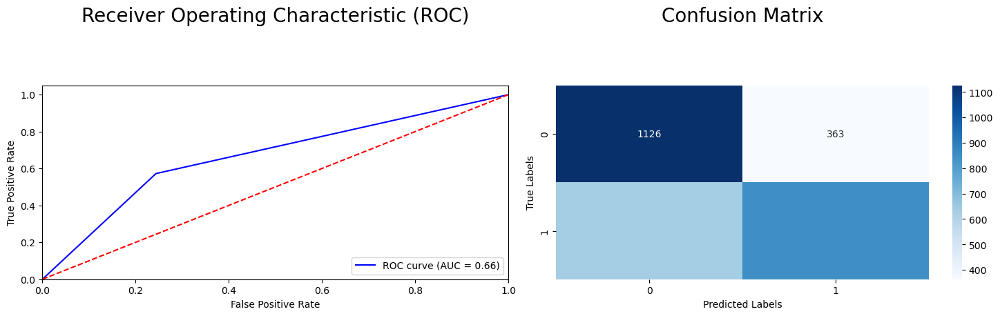

In [29]:
plot_metrics(data_y,y_pred)

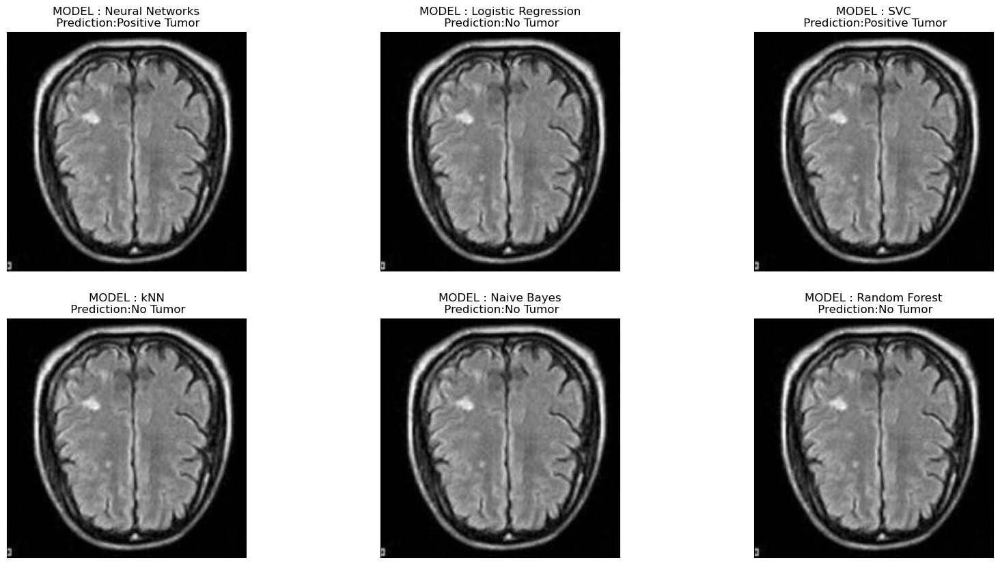

In [30]:
dec = {0:'No Tumor', 1:'Positive Tumor'}
index = 0
img = test_x[index].reshape(1,-1)/255
p_nn = (least_loss_model.predict(img,verbose = 0)> 0.5).astype(int)[0]
p_lg = lg.predict(img)
p_sv = sv.predict(img)
p_knn = knn_model.predict(img)
p_nb = nb_model.predict(img)
p_rf = rf.predict(img)

models = ['Neural Networks','Logistic Regression','SVC','kNN','Naive Bayes','Random Forest']
results = [p_nn,p_lg,p_sv,p_knn,p_nb,p_rf]

fig, axes = plt.subplots(nrows=2,
                         ncols=3,
                         figsize=(20, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       ax.imshow(test_x[index],cmap='gray')
       ax.set_title(f"MODEL : {models[i]}\n Prediction:{dec[results[i][0]]}")


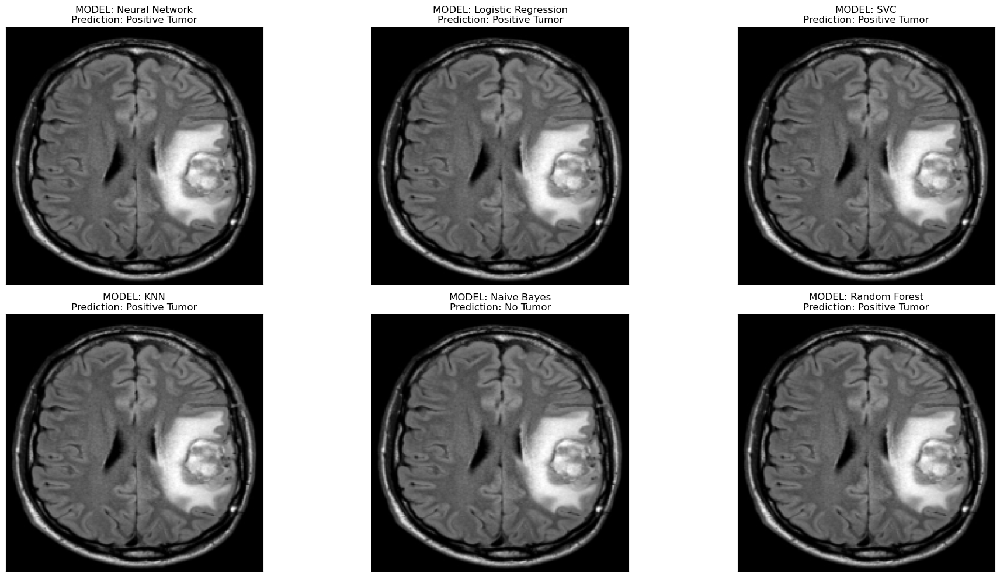

Neural Network: Positive Tumor
Logistic Regression: Positive Tumor
SVC: Positive Tumor
KNN: Positive Tumor
Naive Bayes: No Tumor
Random Forest: Positive Tumor


In [32]:
def predict_single_image(image_path, models):
    # Read and preprocess the new image
    img = cv2.imread(image_path, 0)  # Read in grayscale
    img = cv2.resize(img, (200, 200))  # Resize to match training size
    
    # Reshape and scale the image
    img_scaled = img.reshape(1, -1) / 255.0
    
    # Dictionary to store predictions
    predictions = {}
    dec = {0: 'No Tumor', 1: 'Positive Tumor'}
    
    # Get predictions from each model
    # Neural Network prediction
    if 'neural_network' in models:
        p_nn = (models['neural_network'].predict(img_scaled, verbose=0) > 0.5).astype(int)[0]
        predictions['Neural Network'] = dec[p_nn[0]]
    
    # Logistic Regression prediction
    if 'logistic_regression' in models:
        p_lg = models['logistic_regression'].predict(img_scaled)
        predictions['Logistic Regression'] = dec[p_lg[0]]
    
    # SVC prediction
    if 'svc' in models:
        p_sv = models['svc'].predict(img_scaled)
        predictions['SVC'] = dec[p_sv[0]]
    
    # KNN prediction
    if 'knn' in models:
        p_knn = models['knn'].predict(img_scaled)
        predictions['KNN'] = dec[p_knn[0]]
    
    # Naive Bayes prediction
    if 'naive_bayes' in models:
        p_nb = models['naive_bayes'].predict(img_scaled)
        predictions['Naive Bayes'] = dec[p_nb[0]]
    
    # Random Forest prediction
    if 'random_forest' in models:
        p_rf = models['random_forest'].predict(img_scaled)
        predictions['Random Forest'] = dec[p_rf[0]]
    
    # Visualize the results
    n_models = len(predictions)
    fig_cols = min(3, n_models)
    fig_rows = (n_models + fig_cols - 1) // fig_cols
    
    fig, axes = plt.subplots(nrows=fig_rows, ncols=fig_cols, 
                            figsize=(20, 5*fig_rows),
                            subplot_kw={'xticks': [], 'yticks': []})
    
    if n_models == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    
    for i, (model_name, prediction) in enumerate(predictions.items()):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f"MODEL: {model_name}\nPrediction: {prediction}")
    
    # Hide empty subplots
    for i in range(n_models, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()
    
    return predictions

# Create a dictionary of your trained models
models = {
    'neural_network': least_loss_model,
    'logistic_regression': lg,
    'svc': sv,
    'knn': knn_model,
    'naive_bayes': nb_model,
    'random_forest': rf
}

# Example usage:
image_path = "D:\\image testing\\yes\\Y20.jpg"  # Replace with your image path
predictions = predict_single_image(image_path, models)

# Print predictions
for model_name, prediction in predictions.items():
    print(f"{model_name}: {prediction}")